#Read and Display Image

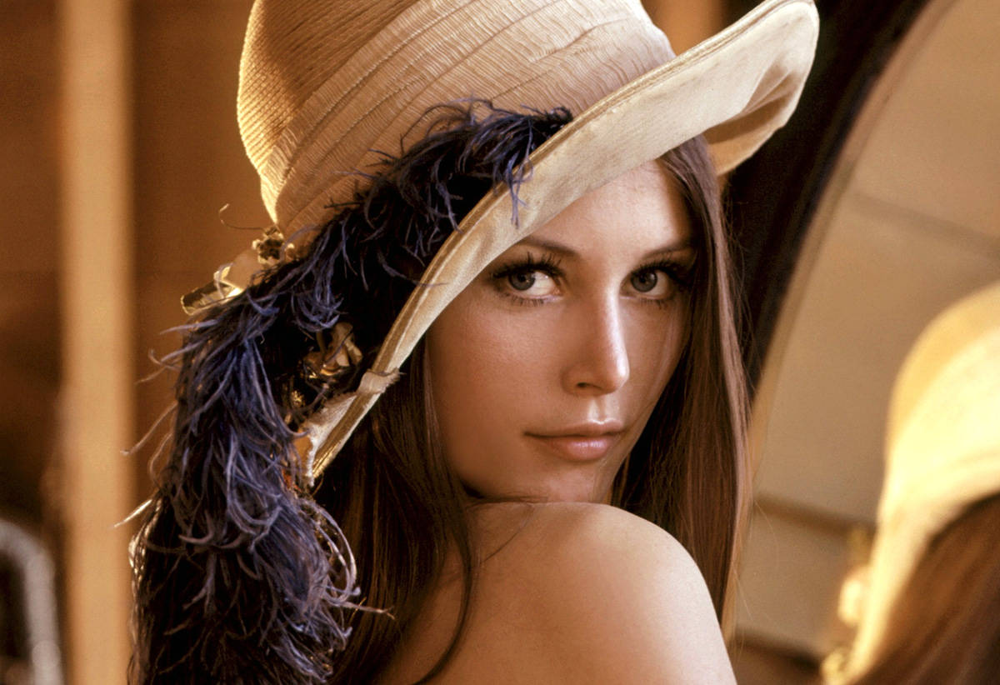

In [ ]:
import numpy as np
import cv2
from google.colab.patches import cv2_imshow
# Load an color image in Colour
img = cv2.imread('Lena.jpg',cv2.IMREAD_COLOR)
#img = cv2.imread('Lena.jpg',1)
# Load an color image in grayscale
img = cv2.imread('Lena.jpg',cv2.IMREAD_GRAYSCALE)
#img = cv2.imread('Lena.jpg',0)
# Load an color image as it is
img = cv2.imread('Lena.jpg',cv2.IMREAD_UNCHANGED)#Reads in BGR format
#img = cv2.imread('Lena.jpg',-1)
cv2_imshow(img)#Converts BGR to RGB then display #For Colab only
#For Jupyter
# cv2.imshow('image',img)
# cv2.waitKey(0)
# cv2.destroyAllWindows()


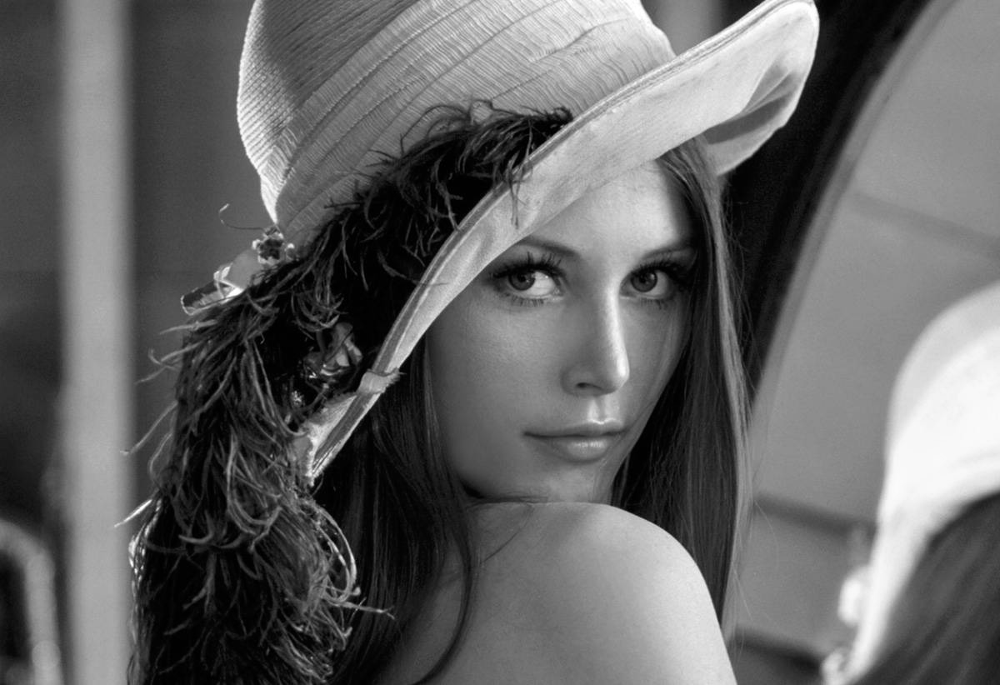

In [ ]:
#Import required library
from PIL import Image

#Open Image
#im = Image.open("Lena.jpg")
im=Image.open('Lena.jpg').convert('L')
im
#im.show()
#im.save('Lena.png')
# im.size
# im.format

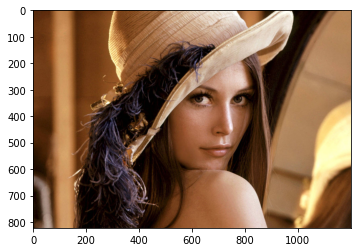

In [ ]:
import matplotlib.pyplot as plt
img1=plt.imread('Lena.jpg')
# The image data. The returned array has shape  

#     - (M, N) for grayscale images.  
#     - (M, N, 3) for RGB images.  
#     - (M, N, 4) for RGBA images.  
#img1.shape
plt.imshow(img1)#cmap can be specified for grayscale image

#Converting to grayscale Image

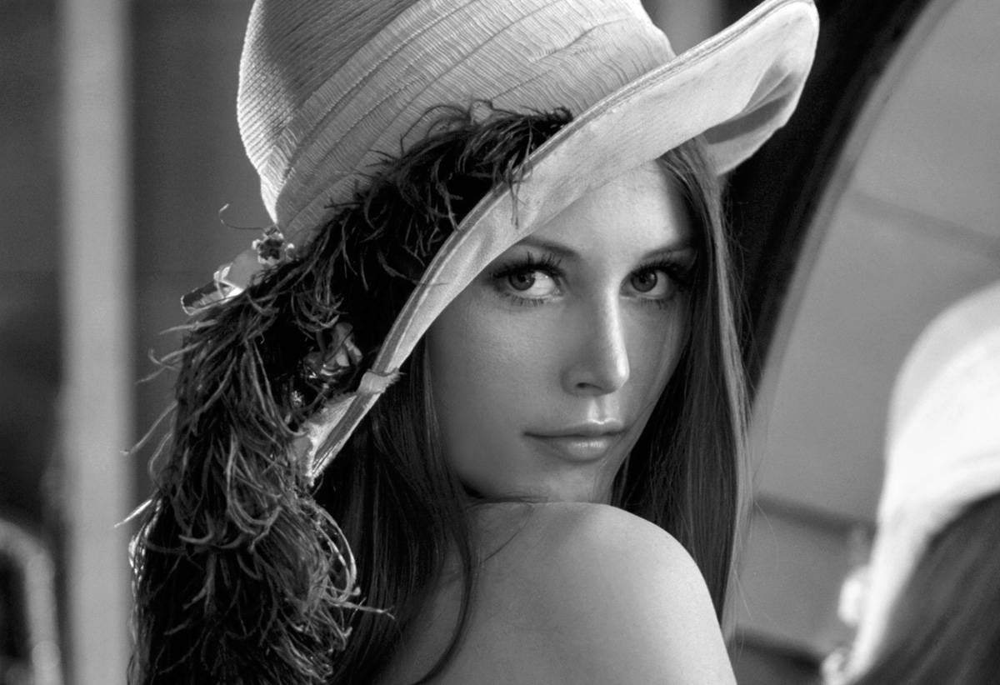

In [ ]:
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
cv2_imshow(gray)

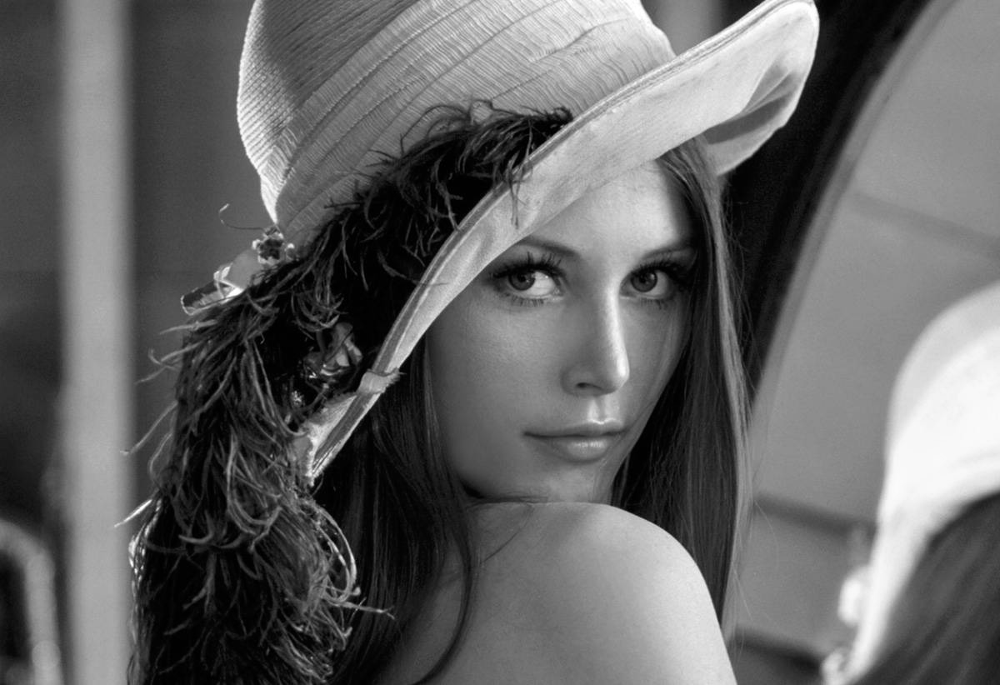

In [ ]:
gray_1 = im.convert('L')
gray_1

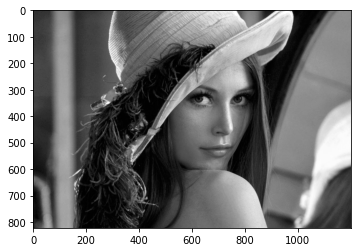

In [ ]:
from skimage.color import rgb2gray
gray_2=rgb2gray(img1)
plt.imshow(gray_2,cmap=plt.cm.gray)

#Geometric Transformation

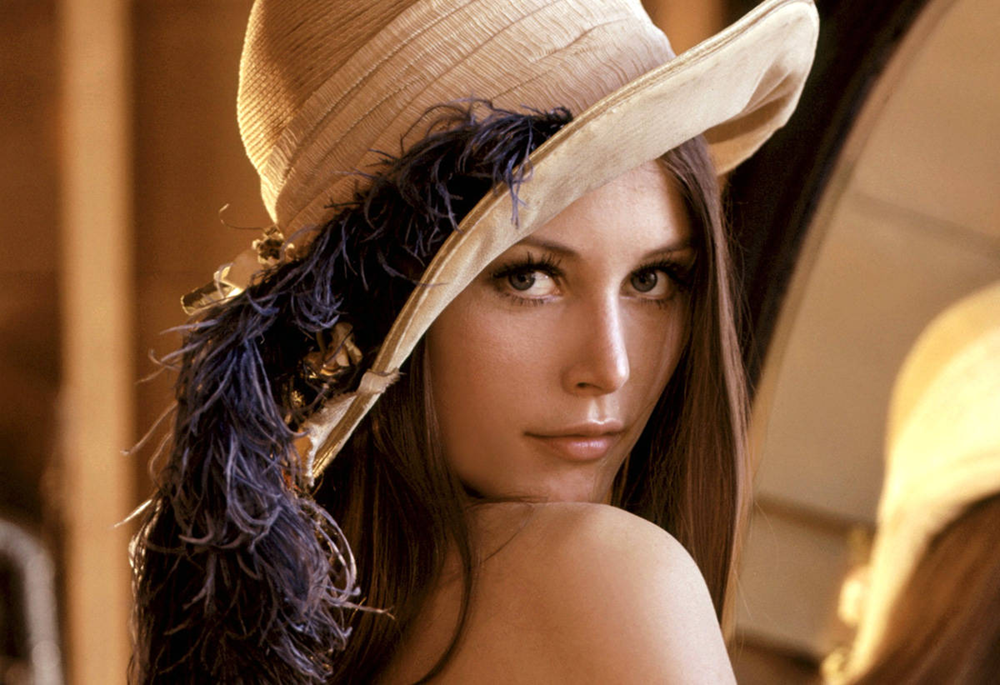

In [ ]:
#Scaling
height, width = img.shape[:2]
res = cv2.resize(img,(2*width, 2*height), interpolation = cv2.INTER_CUBIC)#Preferable interpolation methods are cv2.INTER_AREA for shrinking and cv2.INTER_CUBIC (slow) & cv2.INTER_LINEAR for zooming. By default, interpolation method used is cv2.INTER_LINEAR for all resizing purposes.
cv2_imshow(res)

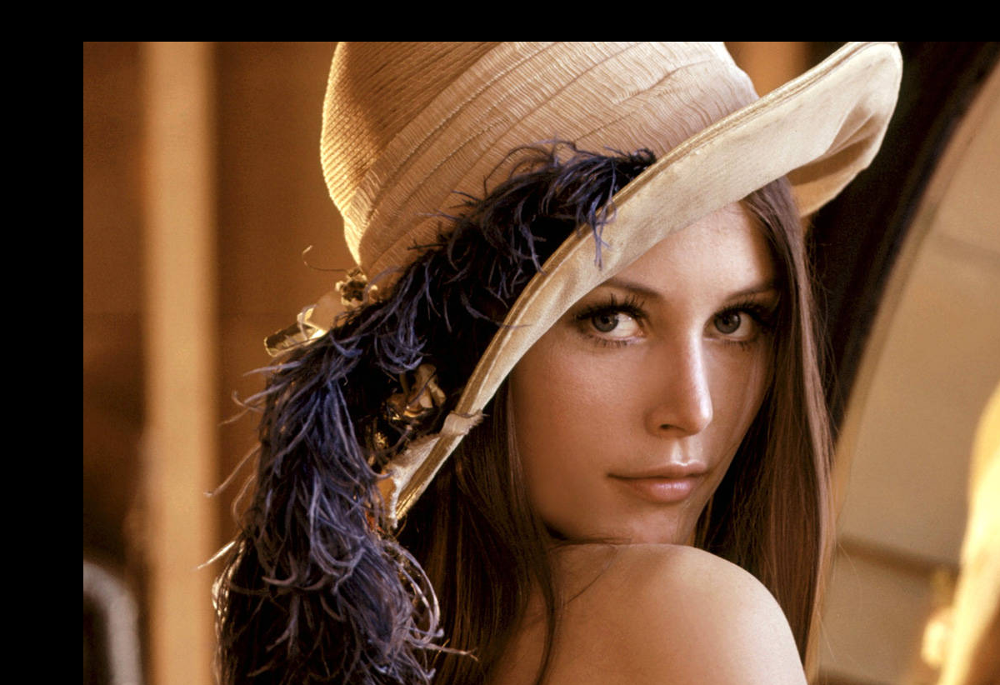

In [ ]:
#Translation
rows,cols = img.shape[:2]
M = np.float32([[1,0,100],[0,1,50]])
 #If you know the shift in (x,y) direction, let it be (t_x,t_y), you can create the transformation matrix M.
dst = cv2.warpAffine(img,M,(cols,rows))
#Third argument of the cv2.warpAffine() function is the size of the output image, which should be in the form of (width, height). Remember width = number of columns, and height = number of rows.
cv2_imshow(dst)

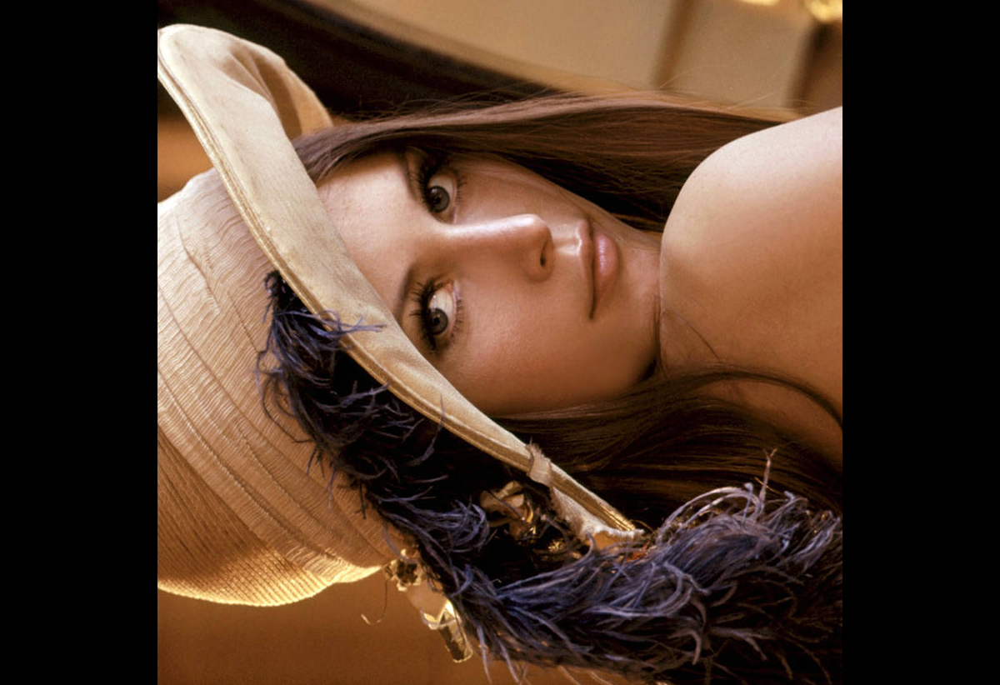

In [ ]:
#Rotation
rows,cols = img.shape[:2]

M = cv2.getRotationMatrix2D((cols/2,rows/2),90,1)
dst = cv2.warpAffine(img,M,(cols,rows))
cv2_imshow(dst)

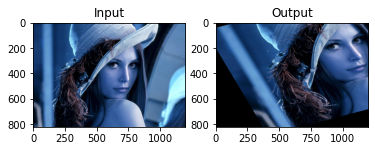

In [ ]:
#Affine Transformation
rows,cols,ch = img.shape

pts1 = np.float32([[50,50],[200,50],[50,200]])
pts2 = np.float32([[10,100],[200,50],[100,250]])

M = cv2.getAffineTransform(pts1,pts2)

dst = cv2.warpAffine(img,M,(cols,rows))

plt.subplot(121),plt.imshow(img),plt.title('Input')
plt.subplot(122),plt.imshow(dst),plt.title('Output')
plt.show()

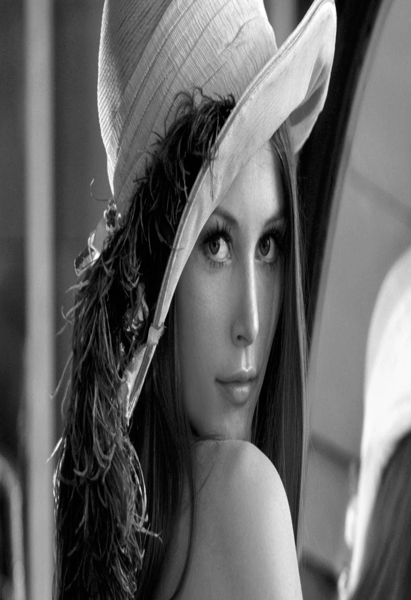

In [ ]:
#Scaling using PIL
width, height = im.size[:2]  
  


 
newsize = (round(.5*height), round(.5*width)) 
im1 = im.resize(newsize) 
# Shows the image in image viewer  
im1

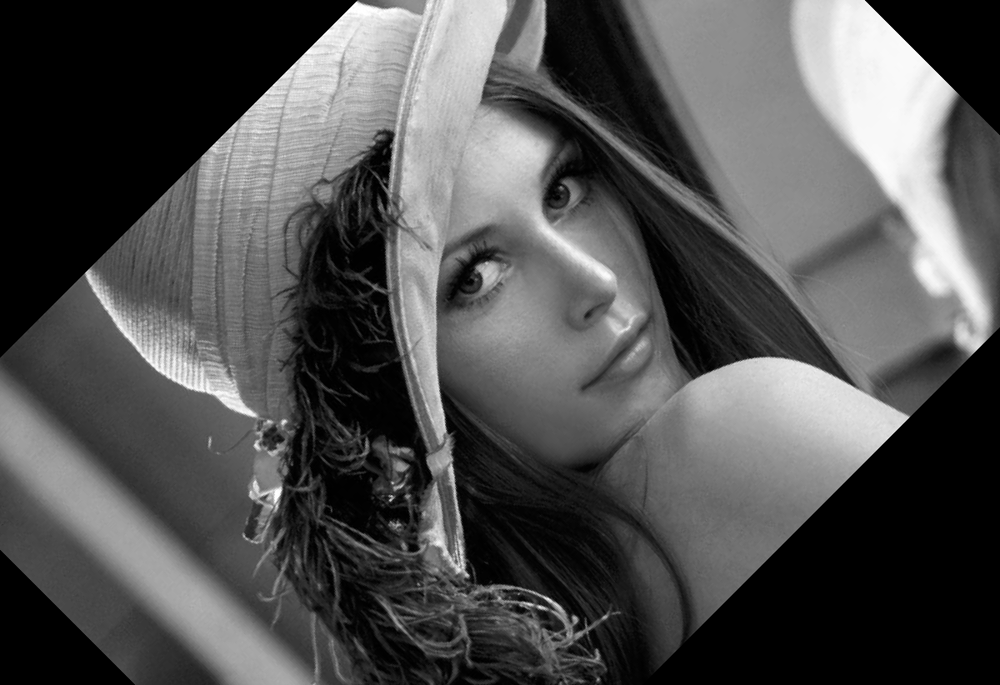

In [ ]:
#Rotate using PIL
im.rotate(45)#for local useim.rotate(45).show

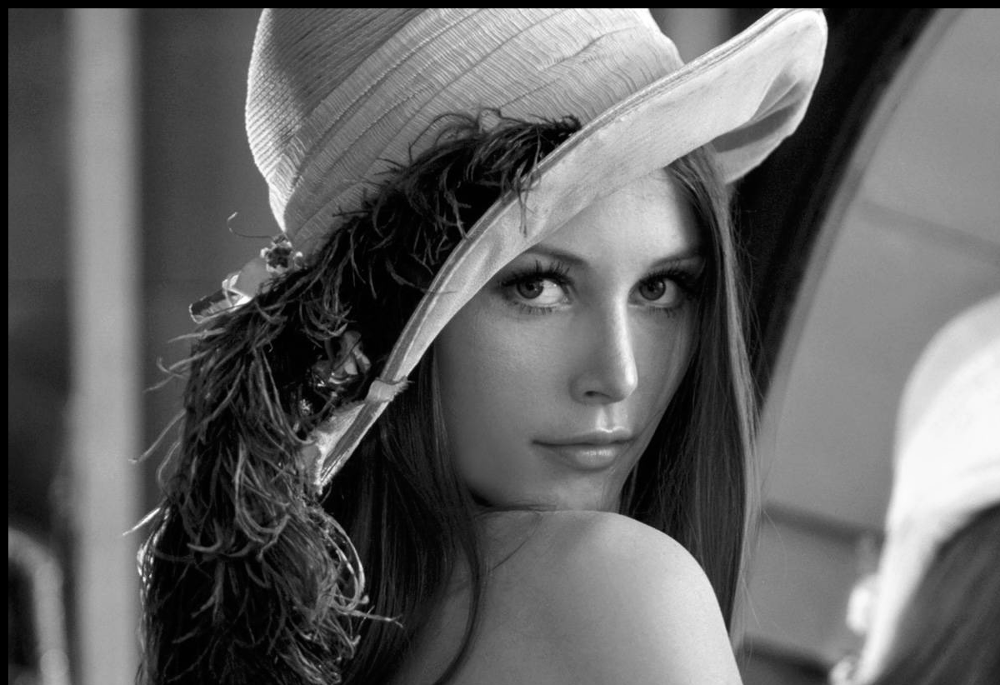

In [ ]:
#Translation and Affine Transformation using PIL
#For each pixel (x, y), the output will be calculated as (ax+by+c, dx+ey+f)
# for translation, you only have to look at the c and f values of your matrix
a = 1
b = 0
c = -10 #left/right (i.e. 5/-5)
d = 0
e = 1
f = -10 #up/down (i.e. 5/-5)
img = im.transform(im.size[:2], Image.AFFINE, (a, b, c, d, e, f))
img

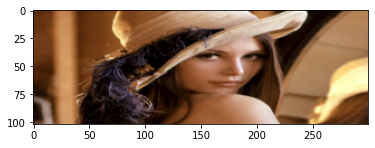

In [ ]:
# Scaling using Skimage
import matplotlib.pyplot as plt

from skimage import data, color
from skimage.transform import rescale, resize, downscale_local_mean

image = img1
image_resized = resize(image, (image.shape[0]/2 // 4, image.shape[1] // 4,image.shape[2]))

plt.imshow(image_resized)

#Binarization of Image

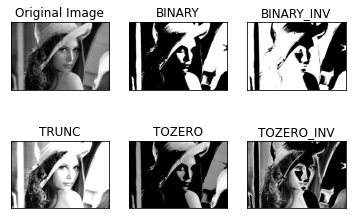

In [ ]:
#Simple Thresholding
import cv2
import numpy as np
from matplotlib import pyplot as plt

img = gray
ret,thresh1 = cv2.threshold(img,127,255,cv2.THRESH_BINARY)
ret,thresh2 = cv2.threshold(img,127,255,cv2.THRESH_BINARY_INV)
ret,thresh3 = cv2.threshold(img,127,255,cv2.THRESH_TRUNC)
ret,thresh4 = cv2.threshold(img,127,255,cv2.THRESH_TOZERO)
ret,thresh5 = cv2.threshold(img,127,255,cv2.THRESH_TOZERO_INV)

titles = ['Original Image','BINARY','BINARY_INV','TRUNC','TOZERO','TOZERO_INV']
images = [img, thresh1, thresh2, thresh3, thresh4, thresh5]

for i in range(6):
    plt.subplot(2,3,i+1),plt.imshow(images[i],'gray')
    plt.title(titles[i])
    plt.xticks([]),plt.yticks([])#current tick locations and labels of the x-axis.

plt.show()

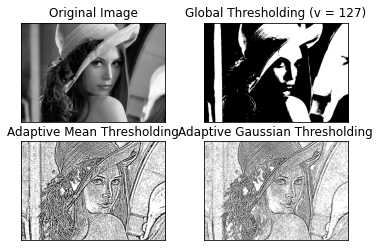

In [ ]:
#Adaptive Thresholding
import cv2
import numpy as np
from matplotlib import pyplot as plt


ret,th1 = cv2.threshold(img,127,255,cv2.THRESH_BINARY)
th2 = cv2.adaptiveThreshold(img,255,cv2.ADAPTIVE_THRESH_MEAN_C,\
            cv2.THRESH_BINARY,11,2)#threshold value is the mean of neighbourhood area.
th3 = cv2.adaptiveThreshold(img,255,cv2.ADAPTIVE_THRESH_GAUSSIAN_C,\
            cv2.THRESH_BINARY,11,2)# threshold value is the weighted sum of neighbourhood values where weights are a gaussian window.

titles = ['Original Image', 'Global Thresholding (v = 127)',
            'Adaptive Mean Thresholding', 'Adaptive Gaussian Thresholding']
images = [img, th1, th2, th3]

for i in range(4):
    plt.subplot(2,2,i+1),plt.imshow(images[i],'gray')
    plt.title(titles[i])
    plt.xticks([]),plt.yticks([])
plt.show()

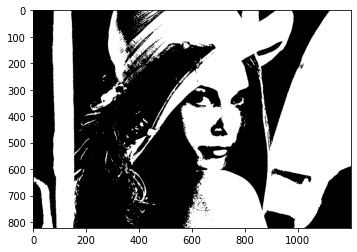

In [ ]:
#Otsu's Thresholding
ret2,th2 = cv2.threshold(img,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)
plt.imshow(th2,cmap='gray')

#Histogram

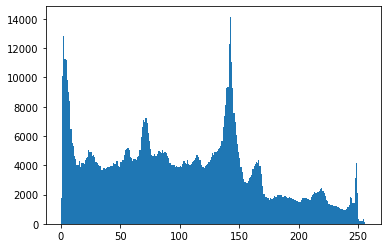

In [ ]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

plt.hist(gray.ravel(),256,[0,256]); plt.show()#For Grayscale image

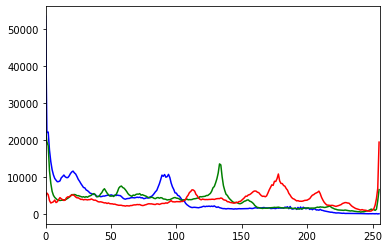

In [ ]:
#For Colour image
img = cv2.imread('Lena.jpg')
color = ('b','g','r')
for i,col in enumerate(color):
    histr = cv2.calcHist([img],[i],None,[256],[0,256])#calcHist(images, channels, mask, histSize, ranges[, hist[, accumulate]]) 
    plt.plot(histr,color = col)
    plt.xlim([0,256])
plt.show()

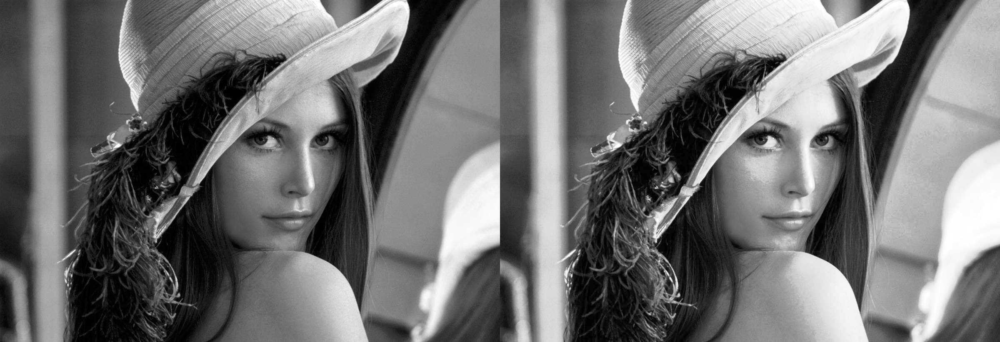

In [ ]:
#Improve contrasts using Hi9stogram equalization
img = cv2.imread('Lena.jpg',0)
equ = cv2.equalizeHist(img)
res = np.hstack((img,equ)) #stacking images side-by-side
cv2_imshow(res)

#Edge Detection using canny method

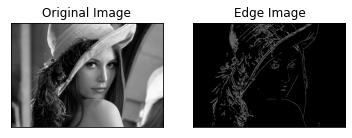

In [ ]:
img = cv2.imread('Lena.jpg',0)
edges = cv2.Canny(img,100,200)

plt.subplot(121),plt.imshow(img,cmap = 'gray')#subplot(nrows, ncols, index, **kwargs)
plt.title('Original Image'), plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(edges,cmap = 'gray')
plt.title('Edge Image'), plt.xticks([]), plt.yticks([])

plt.show()

#Contour detection

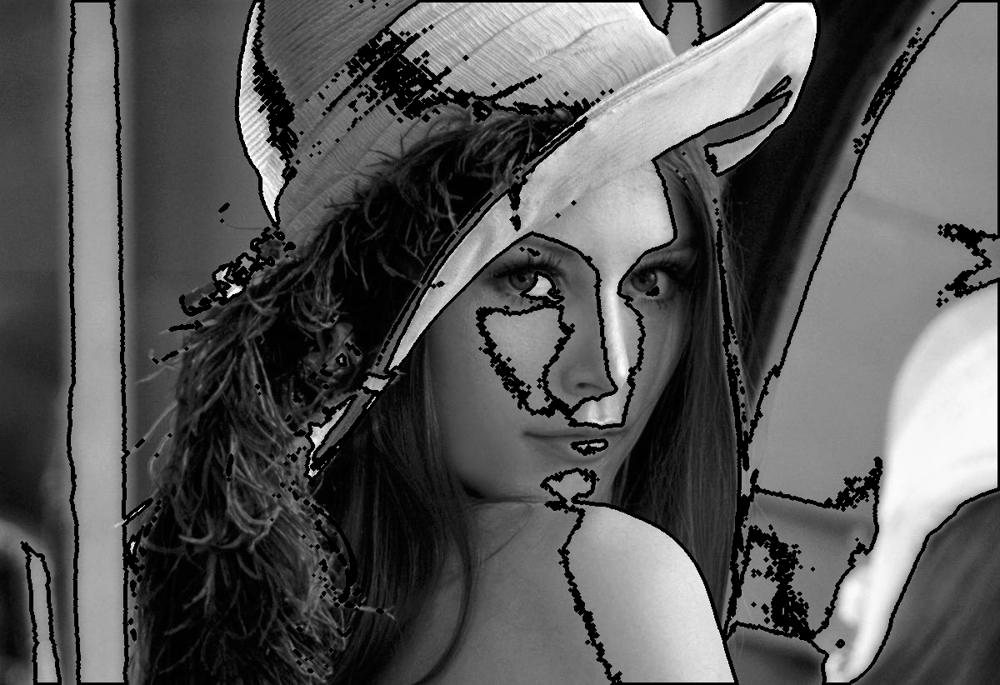

In [ ]:
import numpy as np
import cv2

im = cv2.imread('Lena.jpg')
imgray = cv2.cvtColor(im,cv2.COLOR_BGR2GRAY)
ret,thresh = cv2.threshold(imgray,127,255,0)
contours, hierarchy = cv2.findContours(thresh,cv2.RETR_TREE,cv2.CHAIN_APPROX_NONE)#Contour approx method: If we pass cv2.CHAIN_APPROX_NONE, all the boundary points are stored
#cv2.RETR_TREE tells OpenCV to compute the hierarchy (relationship) between contours
img = cv2.drawContours(img, contours, -1, (0,255,0), 3)
cv2_imshow(img)

#Image Recognition (Using Deep Learning)

In [ ]:
import numpy
from keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten, BatchNormalization, Activation
from keras.layers.convolutional import Conv2D, MaxPooling2D
from keras.constraints import maxnorm
from keras.utils import np_utils

In [ ]:
# Set random seed for purposes of reproducibility
seed = 21

In [ ]:
from keras.datasets import cifar10

In [ ]:
# loading in the data
     
(X_train, y_train), (X_test, y_test) = cifar10.load_data()

In [ ]:
# normalize the inputs from 0-255 to between 0 and 1 by dividing by 255
    
X_train = X_train.astype('float32')
X_test = X_test.astype('float32')
X_train = X_train / 255.0
X_test = X_test / 255.0

In [ ]:
# one hot encode outputs
y_train = np_utils.to_categorical(y_train)
y_test = np_utils.to_categorical(y_test)
class_num = y_test.shape[1]

In [ ]:
#Designing the Model
model = Sequential()
model.add(Conv2D(32, (3, 3), input_shape=X_train.shape[1:], padding='same'))
model.add(Activation('relu'))

model.add(Flatten())

model.add(Dense(128, kernel_constraint=maxnorm(3)))
model.add(Activation('relu'))
model.add(Dropout(0.2))
model.add(BatchNormalization())
model.add(Dense(class_num))
model.add(Activation('softmax'))


In [ ]:
epochs = 25
optimizer = 'adam'

In [ ]:
model.compile(loss='categorical_crossentropy', optimizer=optimizer, metrics=['accuracy'])

In [ ]:
print(model.summary())

Model: "sequential_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_16 (Conv2D)           (None, 32, 32, 32)        896       
_________________________________________________________________
activation_24 (Activation)   (None, 32, 32, 32)        0         
_________________________________________________________________
flatten_3 (Flatten)          (None, 32768)             0         
_________________________________________________________________
dense_12 (Dense)             (None, 128)               4194432   
_________________________________________________________________
activation_25 (Activation)   (None, 128)               0         
_________________________________________________________________
dropout_20 (Dropout)         (None, 128)               0         
_________________________________________________________________
batch_normalization_18 (Batc (None, 128)              

In [ ]:
numpy.random.seed(seed)
model.fit(X_train, y_train, validation_data=(X_test, y_test), epochs=epochs, batch_size=64)

Epoch 1/25
782/782 [==============================] - 77s 99ms/step - loss: 1.5454 - accuracy: 0.4473 - val_loss: 1.4411 - val_accuracy: 0.4818
Epoch 2/25
782/782 [==============================] - 78s 99ms/step - loss: 1.3337 - accuracy: 0.5242 - val_loss: 1.4524 - val_accuracy: 0.4557
Epoch 3/25
782/782 [==============================] - 77s 98ms/step - loss: 1.2917 - accuracy: 0.5405 - val_loss: 1.2170 - val_accuracy: 0.5691
Epoch 4/25
782/782 [==============================] - 76s 98ms/step - loss: 1.2406 - accuracy: 0.5579 - val_loss: 1.2726 - val_accuracy: 0.5501
Epoch 5/25
782/782 [==============================] - 76s 97ms/step - loss: 1.2128 - accuracy: 0.5674 - val_loss: 1.2557 - val_accuracy: 0.5526
Epoch 6/25
782/782 [==============================] - 77s 99ms/step - loss: 1.1854 - accuracy: 0.5766 - val_loss: 1.1811 - val_accuracy: 0.5813
Epoch 7/25
782/782 [==============================] - 76s 97ms/step - loss: 1.1672 - accuracy: 0.5848 - val_loss: 1.2032 - val_accuracy:

In [ ]:
category=['airplane','automobile','bird','cat','deer','dog','frog','horse','ship','truck']
a=model.predict(X_train[0:1])
for i in range(1):
  plt.imshow(X_train[i])
  print(category[np.argmax(a[i])])
